Multil-class Dog Breed Classification

In [1]:
# Unzip the uploaded data into Google Drive
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"

In [2]:
# !grep 'model name' /proc/cpuinfo

**Multil-class Dog Breed Classification**

**Problem**

Identifying the breed of a dog given an image of a dog.
When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

**Data**

The data we're using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/data

**Evaluation**

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

**Features**

Some information about the data:



*   We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
*   There are 120 breeds of dogs (this means there are 120 different classes).
*   There are around 10,000+ images in the training set (these images have labels).
*   There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).


**Imports**

In [3]:
# Import TensorFlow into Colab
# import tensorflow as tf
# print("TF version:", tf.__version__)

# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.19.0
TF Hub version: 0.16.1
GPU available (YESSSS!!!!!)


**Getting our data ready (turning into Tensors)**

In [4]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

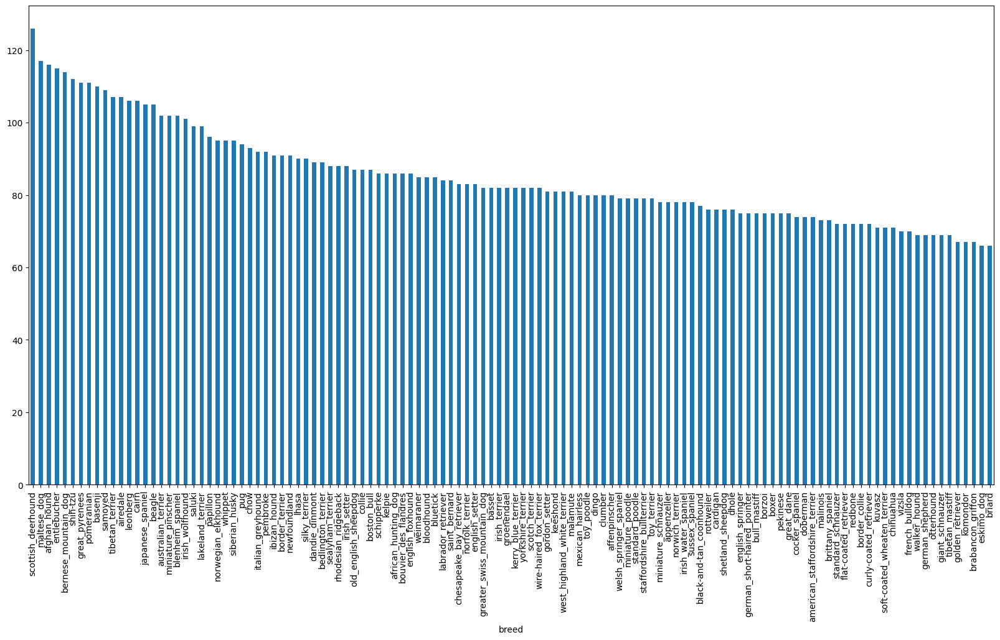

In [6]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [7]:
# What's the median number of images per class?
labels_csv["breed"].value_counts().median()

82.0

In [8]:
# Let's view an image
# from IPython.display import Image
# Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

**Getting images and their labels**

In [9]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


In [12]:
# One more check
# Image(filenames[9000])

In [13]:
# labels_csv["breed"][9000]

In [14]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [17]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [18]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [19]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
len(labels)

10222

In [21]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
len(boolean_labels)

10222

In [23]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [25]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [26]:
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

**Creating our own validation set**

In [27]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [28]:
len(filenames)

10222

In [29]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [30]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [31]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

**Preprocessing Images (turning images into Tensors)**

To preprocess our images into Tensors we're going to write a function which does a few things:

    1. Take an image filepath as input
    2. Use TensorFlow to read the file and save it to a variable, image
    3. Turn our image (a jpg) into Tensors
    4. Normalize our image (convert color channel values from from 0-255 to 0-1).
    5. Resize the image to be a shape of (224, 224)
    6. Return the modified image

In [32]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [33]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [34]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [35]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [36]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

**Turning our data into batches**

In [37]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [38]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [39]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [40]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [41]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

**Visualizing Data Batches**

In [42]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [43]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [44]:
# # Now let's visualize the data in a training batch
# train_images, train_labels = next(train_data.as_numpy_iterator())
# show_25_images(train_images, train_labels)

In [45]:
# # Now let's visualize our validation set
# val_images, val_labels = next(val_data.as_numpy_iterator())
# show_25_images(val_images, val_labels)

**Building a model**

In [46]:
IMG_SIZE

224

In [47]:
# Setup input shape to the model
INPUT_SHAPE = [IMG_SIZE, IMG_SIZE, 3] # height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/5"

In [48]:
INPUT_SHAPE

[224, 224, 3]

In [49]:
import tensorflow as tf
import tensorflow_hub as hub

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Define Hub layer function for Lambda wrapper
    def hub_layer_fn(inputs):
        hub_layer = hub.KerasLayer(model_url, trainable=False)  # Set trainable=False for transfer learning
        return hub_layer(inputs)

    # Setup the model layers
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=input_shape),  # Explicit input layer prevents build issues
        tf.keras.layers.Lambda(hub_layer_fn, name="hub_layer"),  # Wrap Hub layer safely
        tf.keras.layers.Dense(units=output_shape, activation="softmax", name="output_layer")
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    # No explicit .build() needed with Input layer; model is ready
    return model

model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ hub_layer (Lambda)              │ (None, 1001)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 120)            │       120,240 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

**Creating callbacks**

**TensorBoard Callback**

In [50]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [51]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

**Early Stopping Callback**

In [52]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

**Training a model (on subset of data)**

In [53]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [54]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


In [55]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [56]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/5
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 180s 6s/step - accuracy: 0.0401 - loss: 5.1089 - val_accuracy: 0.2950 - val_loss: 3.1750
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 234ms/step - accuracy: 0.6609 - loss: 1.8221 - val_accuracy: 0.5750 - val_loss: 1.9617
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - accuracy: 0.9207 - loss: 0.5817 - val_accuracy: 0.6450 - val_loss: 1.5509
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - accuracy: 0.9894 - loss: 0.2354 - val_accuracy: 0.6800 - val_loss: 1.3862
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 217ms/step - accuracy: 0.9959 - loss: 0.1412 - val_accuracy: 0.7000 - val_loss: 1.3272
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - accuracy: 1.0000 - loss: 0.0917 - val_accuracy: 0.6850 - val_loss: 1.2986
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - accuracy: 1.0000 - loss: 0.0689 - val_accuracy: 0.7100 - val_loss: 1.2742
Epoch

**Checking the TensorBoard logs**

In [57]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

**Making and evaluating predictions using a trained model**

In [58]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [59]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 966ms/step


array([[8.07525124e-03, 9.47651744e-04, 8.29663040e-05, ...,
        2.24699485e-04, 2.13418598e-03, 5.56332851e-03],
       [1.31941447e-03, 4.01412137e-03, 3.54362559e-03, ...,
        3.81188409e-04, 2.02177442e-03, 6.38357005e-06],
       [9.24348285e-07, 2.91974375e-05, 1.22624942e-05, ...,
        1.01994345e-04, 1.14980401e-04, 3.89023597e-04],
       ...,
       [2.47085882e-05, 5.13743944e-05, 7.95718079e-05, ...,
        8.41485507e-06, 4.73053369e-05, 8.78719875e-05],
       [3.78217519e-04, 3.08005074e-05, 1.21254947e-04, ...,
        2.35409370e-05, 1.31822730e-04, 3.30307311e-03],
       [1.15867209e-04, 2.42129772e-06, 3.41433595e-04, ...,
        2.93046748e-03, 3.34182405e-03, 7.30284606e-04]], dtype=float32)

In [60]:
predictions[0]

array([8.07525124e-03, 9.47651744e-04, 8.29663040e-05, 1.13983675e-04,
       2.31664581e-03, 1.44320400e-03, 3.21696214e-02, 1.91134028e-03,
       7.56613270e-04, 2.08639144e-03, 1.18101947e-03, 1.31507768e-04,
       2.47069052e-03, 2.86368508e-04, 1.92058851e-05, 1.34184421e-03,
       6.18271937e-04, 4.57098708e-02, 8.98897706e-05, 7.06484483e-04,
       1.59083051e-03, 7.13604619e-04, 7.12997513e-04, 3.33188800e-03,
       7.92517239e-05, 6.61133323e-04, 4.69967574e-02, 3.98588192e-04,
       2.54241284e-04, 8.43477319e-04, 1.84340391e-03, 2.82329111e-03,
       2.07313031e-04, 1.93805041e-04, 2.28446588e-04, 1.64801721e-02,
       2.53382372e-04, 1.37645379e-03, 1.28356871e-04, 3.00931279e-03,
       1.35601102e-03, 3.31335177e-04, 1.14420203e-04, 3.15430434e-03,
       3.05700861e-03, 9.41358216e-04, 1.40823104e-04, 1.56671449e-04,
       2.29297415e-03, 1.38873386e-03, 5.98898587e-05, 5.89029398e-04,
       1.32850036e-02, 1.00196747e-03, 2.10877173e-04, 5.75693230e-05,
      

In [61]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[3.03762245e-05 2.26976340e-06 1.08115846e-05 8.02070354e-05
 1.21398747e-03 3.41541454e-05 1.13965776e-04 1.08564016e-03
 1.13360758e-03 7.74250692e-03 8.95232915e-06 4.97187102e-06
 7.55238652e-05 2.46011186e-03 9.74240611e-05 4.24170605e-04
 4.71050180e-06 6.89750450e-05 1.47429935e-04 3.93947766e-06
 1.54382246e-06 1.07181235e-03 4.96418579e-06 3.20634535e-06
 1.46264222e-03 5.42574980e-07 1.04348001e-05 3.13816395e-06
 1.59863521e-05 7.52205688e-06 6.55386884e-06 2.04368553e-05
 9.91104571e-06 6.85022678e-05 1.71572174e-05 1.79016279e-05
 2.31176527e-05 3.26043199e-04 6.14913279e-06 7.33940899e-01
 1.35698923e-04 1.22436095e-05 2.56849453e-04 5.96773634e-06
 1.56972237e-05 2.90019252e-05 4.27780877e-04 3.42202657e-05
 5.39920529e-06 1.20664467e-04 9.23781045e-06 6.23549249e-06
 4.65860270e-04 3.00122978e-04 1.96108122e-05 3.66672350e-04
 7.58149372e-06 7.09913584e-05 1.39483382e-06 5.05989465e-06
 1.33607347e-04 7.29188250e-05 1.70315491e-06 3.81072800e-06
 3.29659742e-05 4.135748

In [62]:
unique_breeds[39]

'english_foxhound'

In [63]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'irish_setter'

In [64]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [65]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [66]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

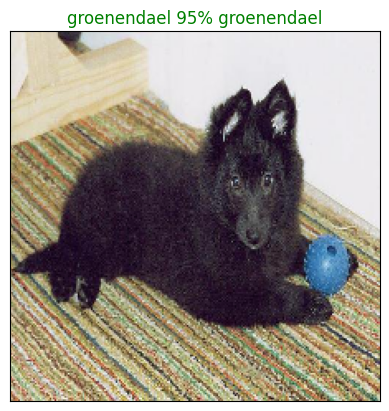

In [67]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [68]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

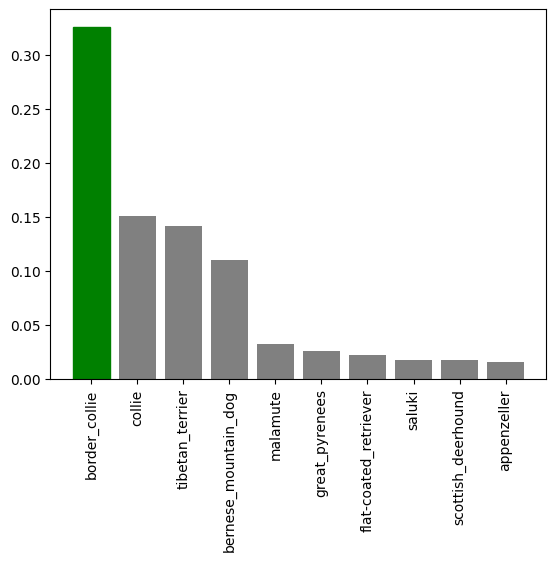

In [69]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

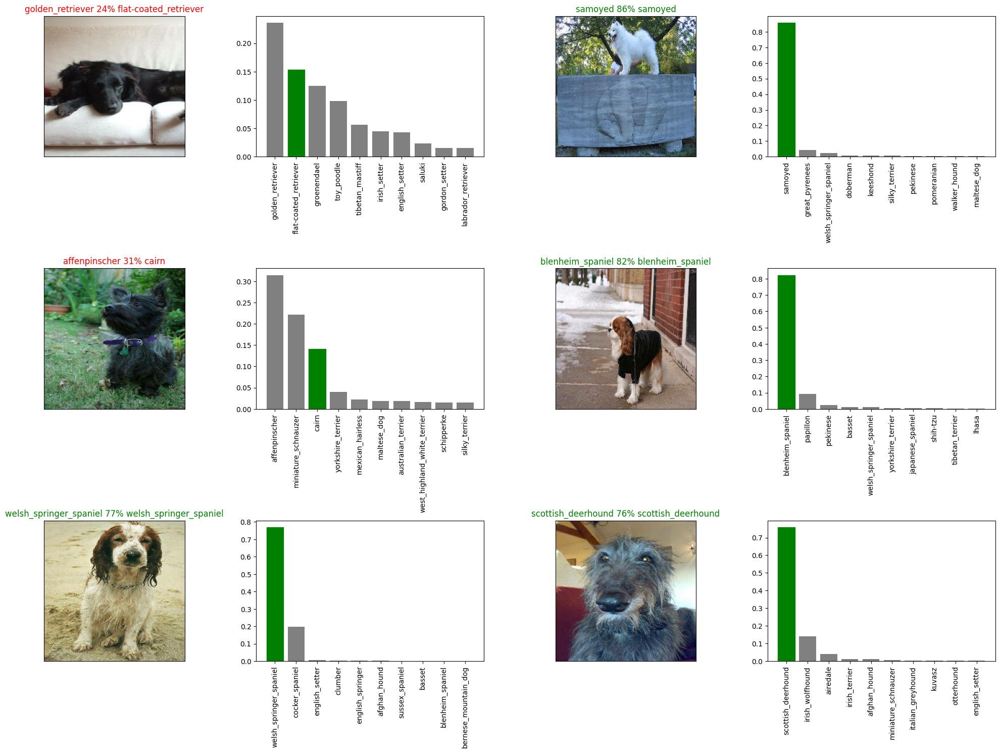

In [70]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [87]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - accuracy: 0.6952 - loss: 1.1881


[1.224946141242981, 0.699999988079071]

**Training a big dog model 🐶 (on the full data)**

In [88]:
len(X), len(y)

(10222, 10222)

In [89]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [90]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [92]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/5


In [93]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [94]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 69s 169ms/step - accuracy: 0.5055 - loss: 2.3203
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - accuracy: 0.8886 - loss: 0.3801
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - accuracy: 0.9441 - loss: 0.2073
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - accuracy: 0.9714 - loss: 0.1328
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 131ms/step - accuracy: 0.9844 - loss: 0.0876
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 132ms/step - accuracy: 0.9869 - loss: 0.0704
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 132ms/step - accuracy: 0.9921 - loss: 0.0525
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - accuracy: 0.9949 - loss: 0.0391
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - accuracy: 0.9965 - loss: 0.0329
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - accuracy: 0.9990 - loss: 0.0228
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - accuracy: 0.9973 - loss: 0.0254
Epoch 12

**Making predictions on the test dataset**

In [95]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e334f758c7944df19c98d49498d28c64.jpg',
 'drive/My Drive/Dog Vision/test/e42105cc55af6788d3c15473c562dc77.jpg',
 'drive/My Drive/Dog Vision/test/dfe02d52ca281aaca6215a42fee6245c.jpg',
 'drive/My Drive/Dog Vision/test/e2ef94a22af1d5375132de4eb19d2a64.jpg',
 'drive/My Drive/Dog Vision/test/e3a2e1a4c44509d7aa7777d88c5cd45a.jpg',
 'drive/My Drive/Dog Vision/test/dd5c5652d5d34e922af98c9b0295d909.jpg',
 'drive/My Drive/Dog Vision/test/e73dc6a8f2d7c941f28c0a5298bc5bdc.jpg',
 'drive/My Drive/Dog Vision/test/dcd3cfe0cd6d363a3ed21639c434c8d3.jpg',
 'drive/My Drive/Dog Vision/test/e3982348ad8b974cef2298f741bc3c99.jpg',
 'drive/My Drive/Dog Vision/test/e4f8465214c9644b10c536ecb087b7be.jpg']

In [96]:
len(test_filenames)

10357

In [98]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [99]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [101]:
# Make predictions on test data batch using the loaded full model
test_predictions = full_model.predict(test_data,
                                             verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 199s 585ms/step


In [112]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [113]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [114]:
test_predictions[:10]

array([[7.93429988e-10, 1.61295963e-10, 1.05672537e-11, ...,
        7.02424993e-11, 3.08690147e-07, 3.06692726e-07],
       [4.56359643e-08, 3.89835400e-08, 1.07107205e-07, ...,
        2.08273399e-08, 1.41431414e-07, 2.99800035e-07],
       [2.69295641e-10, 1.20671398e-11, 2.44509361e-11, ...,
        4.95611451e-12, 2.20490449e-07, 3.59468942e-07],
       ...,
       [7.93506771e-09, 7.92620369e-09, 5.75836850e-07, ...,
        8.94956609e-10, 5.38855165e-05, 1.50891196e-06],
       [3.86430388e-10, 3.90230591e-11, 4.19858426e-10, ...,
        2.34892078e-10, 1.13169563e-08, 5.95917982e-10],
       [3.48944496e-07, 1.35645606e-09, 4.05203515e-08, ...,
        6.21148820e-06, 2.55119971e-07, 1.39192813e-12]])

In [115]:
test_predictions.shape

(10357, 120)

**Preparing test dataset predictions for Kaggle**

In [116]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [117]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [118]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e334f758c7944df19c98d49498d28c64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e42105cc55af6788d3c15473c562dc77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dfe02d52ca281aaca6215a42fee6245c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e2ef94a22af1d5375132de4eb19d2a64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e3a2e1a4c44509d7aa7777d88c5cd45a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [119]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e334f758c7944df19c98d49498d28c64,7.934300e-10,1.612960e-10,1.056725e-11,8.990547e-11,6.083225e-08,2.885208e-09,2.146129e-06,3.724226e-10,2.795266e-09,...,1.599033e-06,2.570486e-10,2.470416e-09,1.420800e-11,4.328925e-08,1.640975e-09,2.313709e-07,7.024250e-11,3.086901e-07,3.066927e-07
1,e42105cc55af6788d3c15473c562dc77,4.563596e-08,3.898354e-08,1.071072e-07,6.432426e-08,1.335168e-09,7.266406e-08,1.020922e-05,2.056943e-06,8.277980e-11,...,3.861399e-11,1.553361e-08,9.400262e-10,5.083139e-09,2.933250e-09,4.841566e-09,8.605525e-10,2.082734e-08,1.414314e-07,2.998000e-07
2,dfe02d52ca281aaca6215a42fee6245c,2.692956e-10,1.206714e-11,2.445094e-11,2.813582e-11,1.571212e-08,3.786754e-11,6.435854e-09,6.146238e-11,1.901270e-09,...,8.106002e-04,1.000694e-08,1.419953e-09,3.566046e-12,9.571815e-09,4.753498e-10,1.087713e-08,4.956115e-12,2.204904e-07,3.594689e-07
3,e2ef94a22af1d5375132de4eb19d2a64,3.462050e-10,1.392895e-10,2.781117e-08,3.696816e-06,1.556748e-08,1.406271e-05,7.888771e-07,5.659606e-06,7.030636e-04,...,1.731923e-09,1.961910e-08,9.969451e-07,8.446428e-03,1.672107e-08,2.084527e-07,3.775041e-09,8.391156e-09,2.201471e-06,3.108792e-08
4,e3a2e1a4c44509d7aa7777d88c5cd45a,2.076128e-12,1.022504e-12,1.872912e-12,9.361727e-14,3.053042e-11,2.415787e-10,5.639938e-12,8.884759e-15,2.200472e-10,...,7.971623e-10,1.304225e-12,3.367131e-12,2.540660e-12,1.954437e-13,1.425517e-07,3.232934e-13,1.282945e-12,1.188896e-11,6.424708e-11


In [120]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

**Making predictions on custom images**

In [121]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [122]:
custom_image_paths

['drive/My Drive/Dog Vision/dog-photos/1.jpg',
 'drive/My Drive/Dog Vision/dog-photos/2.jpg']

In [123]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [126]:
# Make predictions on the custom data
custom_preds = full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


In [127]:
custom_preds.shape

(2, 120)

In [128]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pekinese', 'pekinese']

In [129]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

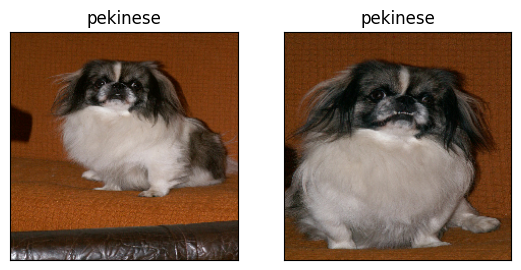

In [130]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)